# 1.라이브러리불러오기

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.chdir("/content/drive/MyDrive/데이터분석_프로젝트/ai_factory/data_set")
os.getcwd()

'/content/drive/MyDrive/데이터분석_프로젝트/ai_factory/data_set'

In [ ]:
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
plt.style.use(['dark_background'])

# 2.데이터 불러오기

In [ ]:
train_df = pd.read_csv("train_data.csv")
test_df = pd.read_csv("test_data.csv")
sub_df = pd.read_csv("answer_sample.csv")

In [ ]:
# monitor vibe 보정
type_1 = train_df[train_df["type"] == 1]
outlier_index = type_1[type_1["motor_vibe"] > 15].index
outlier = train_df.iloc[outlier_index]["motor_temp"] / 20
outlier = outlier.values
train_df.loc[outlier_index, "motor_vibe"] = outlier
train_df.to_csv("train_df_correction_2.csv", index =False)

In [ ]:
type_1 = train_df[train_df["type"] == 1]

In [ ]:
outlier_index = type_1[type_1["motor_vibe"] > 15].index

In [ ]:
outlier_index 

Int64Index([], dtype='int64')

In [ ]:
outlier = train_df.iloc[outlier_index]["motor_temp"] / 20

In [ ]:
outlier = outlier.values
train_df.loc[outlier_index, "motor_vibe"] = outlier
train_df.to_csv("train_df_correction_2.csv", index =False)

In [ ]:
train_df.iloc[outlier_index]

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,type


# 3.EDA

In [ ]:
58.67 / 2.93

20.023890784982935

In [ ]:
train_df.head()

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,type
0,1.59,41.00,0.7,20.53,1680.0,58.67,2.93,0
1,2.97,59.28,0.7,38.40,3142.0,74.91,3.75,0
2,1.91,45.29,0.7,24.73,2023.0,62.48,3.12,0
3,2.37,51.33,0.7,30.63,2506.0,67.84,3.39,0
4,1.90,45.21,0.7,24.65,2017.0,62.41,3.12,0


## 결측치 확인

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2463 entries, 0 to 2462
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   air_inflow     2463 non-null   float64
 1   air_end_temp   2463 non-null   float64
 2   out_pressure   2463 non-null   float64
 3   motor_current  2463 non-null   float64
 4   motor_rpm      2463 non-null   float64
 5   motor_temp     2463 non-null   float64
 6   motor_vibe     2463 non-null   float64
 7   type           2463 non-null   int64  
dtypes: float64(7), int64(1)
memory usage: 154.1 KB


In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7389 entries, 0 to 7388
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   air_inflow     7389 non-null   float64
 1   air_end_temp   7389 non-null   float64
 2   out_pressure   7389 non-null   float64
 3   motor_current  7389 non-null   float64
 4   motor_rpm      7389 non-null   float64
 5   motor_temp     7389 non-null   float64
 6   motor_vibe     7389 non-null   float64
 7   type           7389 non-null   int64  
dtypes: float64(7), int64(1)
memory usage: 461.9 KB


## type 분포

In [ ]:
train_df["type"].value_counts(normalize = True)

0    0.175396
1    0.149817
2    0.148599
3    0.124239
4    0.124239
5    0.101096
6    0.101096
7    0.075518
Name: type, dtype: float64

In [ ]:
test_df["type"].value_counts(normalize = True)

0    0.175396
1    0.149817
2    0.148599
3    0.124239
4    0.124239
5    0.101096
6    0.101096
7    0.075518
Name: type, dtype: float64

### 분석 결과



*   test_ train 모두 null 값이 없는 것으로 확인

*   test_train type의 분포가 동일한 것으로 확인






## 변수통계치

In [ ]:
train_df.describe()

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,type
count,2463.000000,2463.000000,2.463000e+03,2463.000000,2463.000000,2463.000000,2463.000000,2463.000000
mean,2.128843,49.001137,7.000000e-01,27.490715,2372.576939,65.766707,3.336035,2.957369
std,1.202328,8.725091,1.110448e-16,13.604597,687.870774,7.797152,0.647902,2.230113
min,0.330000,32.030000,7.000000e-01,5.340000,1201.000000,50.360000,1.970000,0.000000
25%,1.280000,41.600000,7.000000e-01,17.110000,1784.500000,59.150000,2.880000,1.000000
50%,1.960000,48.980000,7.000000e-01,25.850000,2358.000000,65.640000,3.250000,3.000000
75%,2.820000,56.355000,7.000000e-01,36.000000,2971.000000,72.275000,3.720000,5.000000
max,6.220000,64.960000,7.000000e-01,72.000000,3564.000000,80.520000,5.180000,7.000000


In [ ]:
test_df.describe()

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,type
count,7389.000000,7389.000000,7389.000000,7389.000000,7389.000000,7389.000000,7389.000000,7389.000000
mean,2.103129,49.042735,0.699840,27.417935,2373.820003,65.771623,3.345523,2.957369
std,1.163998,8.686208,0.005377,13.234089,687.737182,7.741473,0.644199,2.229811
min,0.340000,32.080000,0.490000,5.370000,1200.000000,50.420000,1.970000,0.000000
25%,1.280000,41.510000,0.700000,17.200000,1774.000000,59.110000,2.890000,1.000000
50%,1.940000,48.760000,0.700000,26.170000,2355.000000,65.520000,3.260000,3.000000
75%,2.770000,56.580000,0.700000,35.860000,2972.000000,72.440000,3.730000,5.000000
max,6.240000,65.540000,0.700000,74.000000,3564.000000,82.390000,6.260000,7.000000


### 분석 결과


*   train_data는 out_pressure이 다 같음
*   test_data out_pressure는 min값이 다름
*   즉 out_pressure가 낮은 데이터가 비정상일 가능성이 있음

---

*   moitor vibe data 의 경우 train과 test data의 min max 편차가 심함
*   즉 moitor 수치가 이상에 영향을 줄 수 도 있을것으로 보임






## 시각화



*   해당 데이터는 1시간 마다 설비의 상태를 기록한 데이터(시계열)
*   각 설비 데이터의 작동 시점이 독립적이라 가정
*   각 설비를 따로 시각화 진행



In [ ]:
df_col = train_df.columns

In [ ]:
df_col

Index(['air_inflow', 'air_end_temp', 'out_pressure', 'motor_current',
       'motor_rpm', 'motor_temp', 'motor_vibe', 'type'],
      dtype='object')

In [ ]:
train_df.reset_index(inplace = True)
test_df.reset_index(inplace = True)

### 전체 데이터 시각화

In [ ]:
def show_type_data(df, columns, start = 0, end = 100) :
    fig, axs = plt.subplots(figsize = (24, 20), nrows =8, ncols = 1, squeeze = False)
    for i, column in  enumerate(columns, start = 0) :
        plt.title(column)
        sns.lineplot(data = df[start : end], x = "index", y = column, ax = axs[i][0] , label =column)

#### 학습데이터 전체

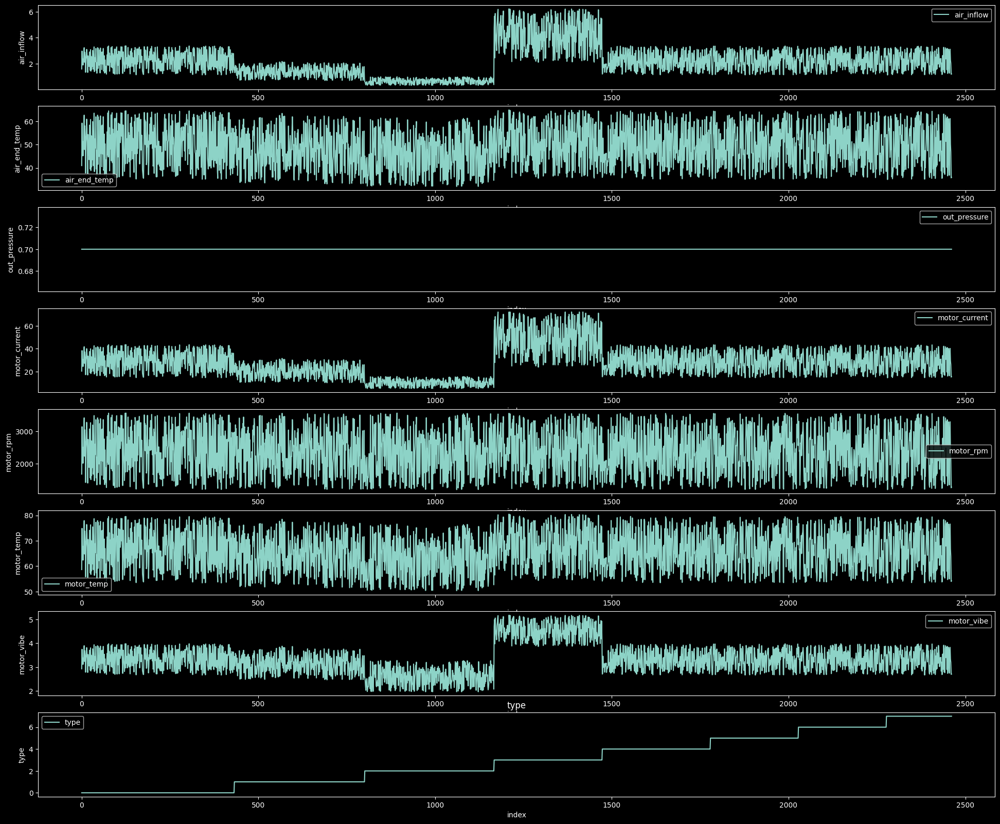

In [ ]:
show_type_data(train_df, df_col, end = -1)

### 테스트 데이터 전체

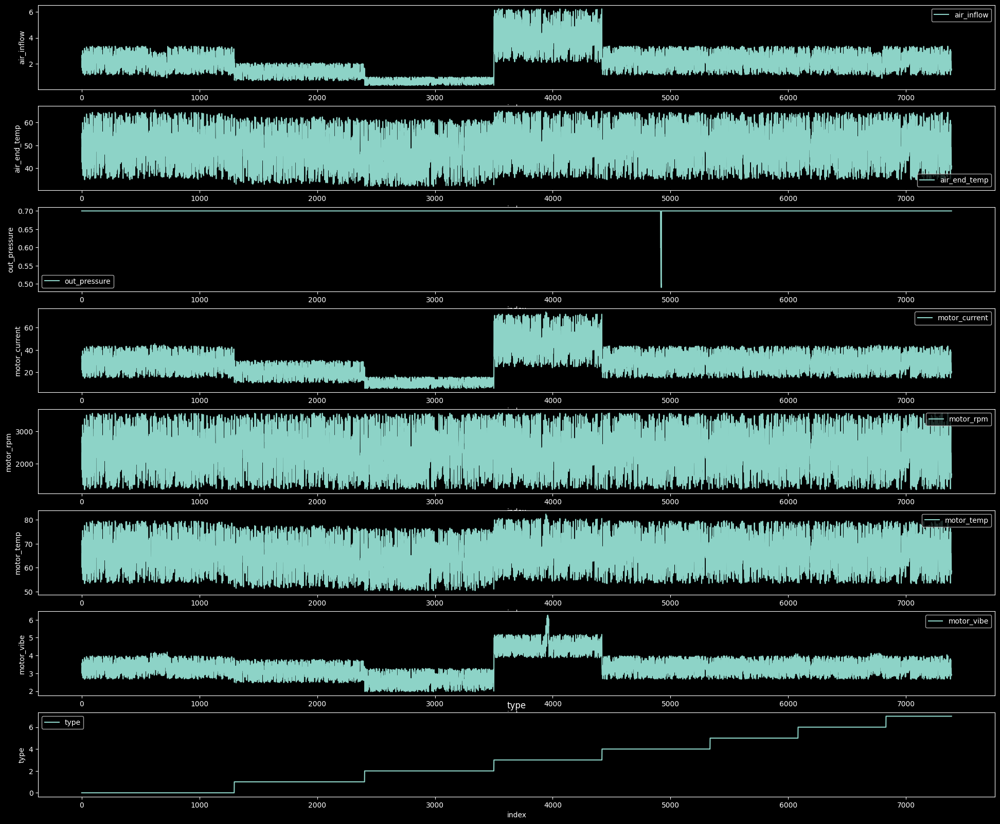

In [ ]:
show_type_data(test_df, df_col, end = -1 )

#### 부분데이터 시각화

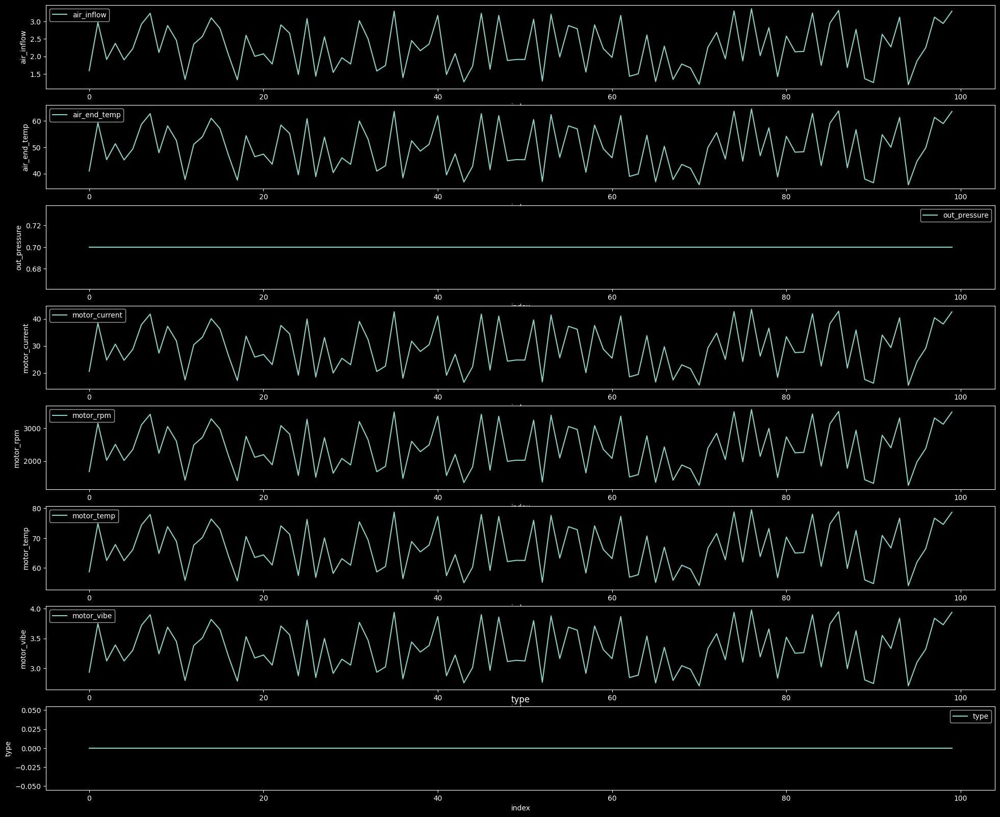

In [ ]:
# 트레이닝 부분 데이터 시각화
show_type_data(train_df, df_col, start = 0, end = 100)

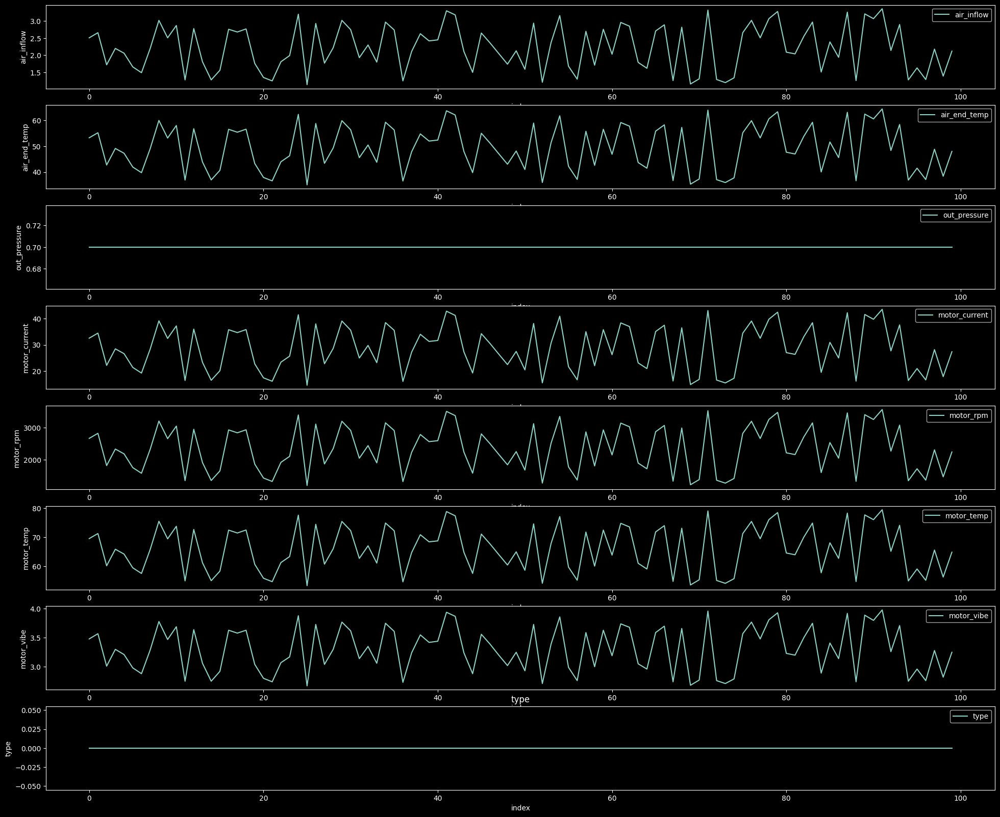

In [ ]:
# 테스트 부분 데이터 시각화
show_type_data(test_df, df_col, start = 0, end = 100)

#### 문제가 있어보이는 구간

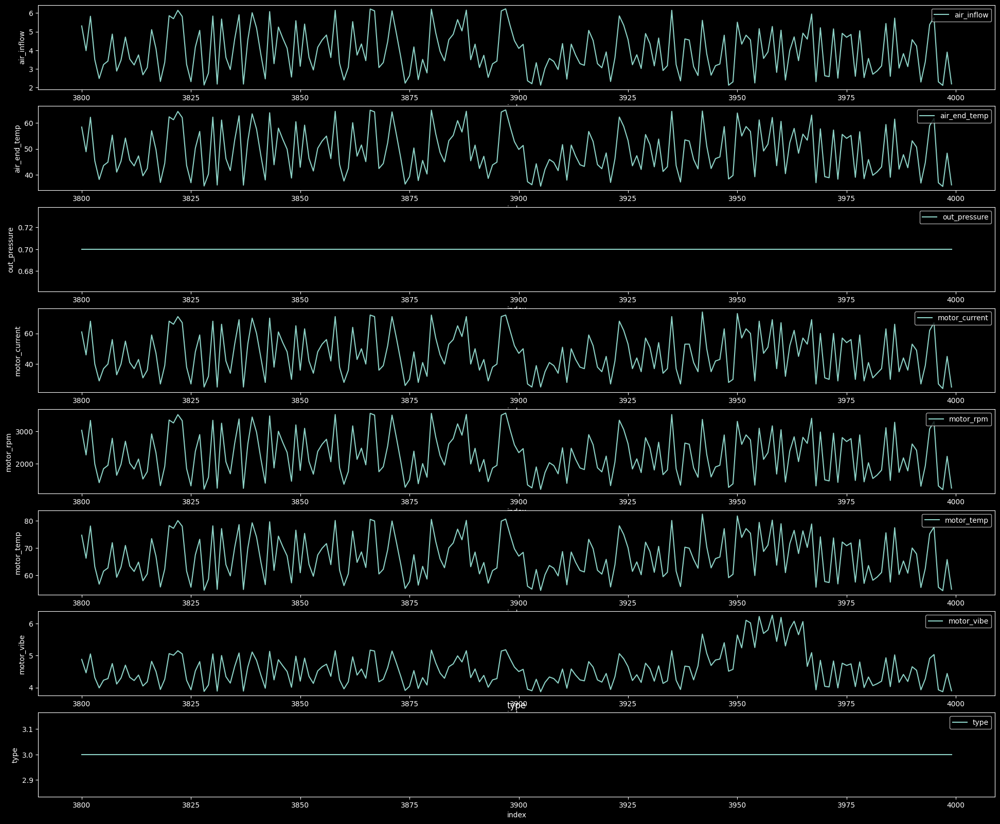

In [ ]:
show_type_data(test_df, df_col, start = 3800, end = 4000 )

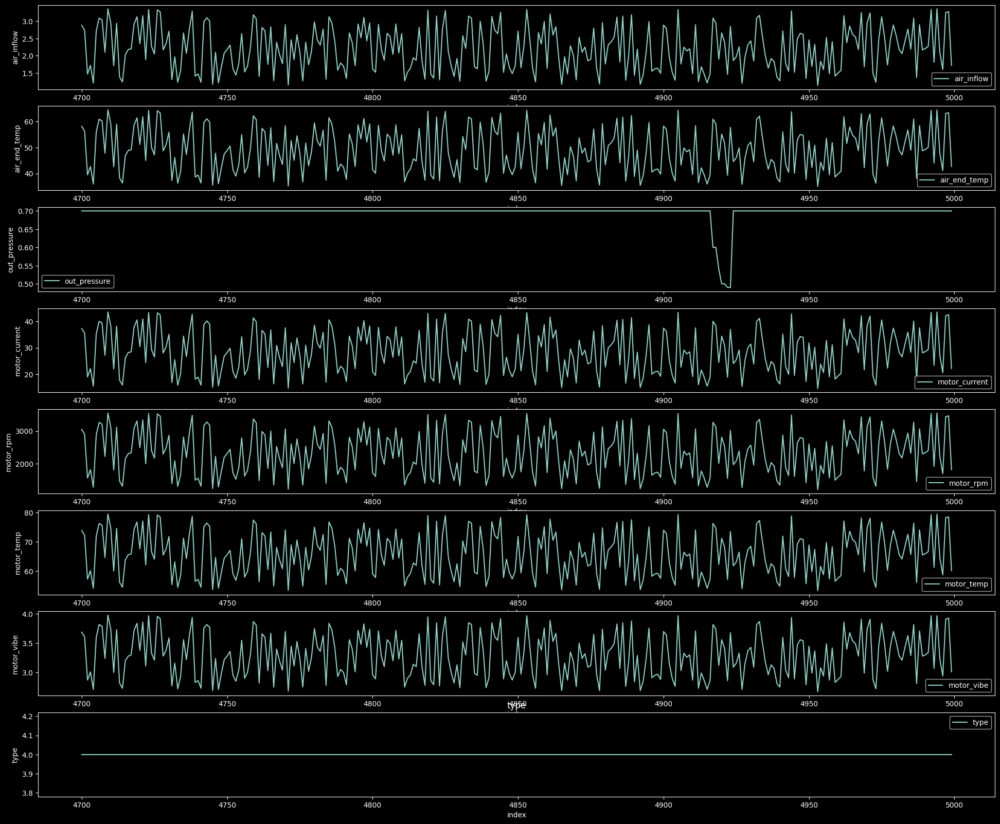

In [ ]:
show_type_data(test_df, df_col, start = 4700, end = 5000 )

### 정규화 후 시각화

### minmax scaling

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [ ]:
st_cols = train_df.drop(["index","type"], axis = 1).columns
st_cols 

Index(['air_inflow', 'air_end_temp', 'out_pressure', 'motor_current',
       'motor_rpm', 'motor_temp', 'motor_vibe'],
      dtype='object')

In [ ]:
scaler =  MinMaxScaler()

In [ ]:
# 타입별로 minmax scaling 진행
def minmax_cat (tr_df, te_df, i) :

    tr_df = train_df[train_df["type"] == i]
    te_df = test_df[test_df["type"] == i]
    
    tr_df.drop(["index","type"], axis = 1, inplace = True)
    te_df.drop(["index","type"], axis = 1, inplace = True)

    scaler.fit(tr_df)

    st_train_df = scaler.transform(tr_df)
    st_test_df = scaler.transform(te_df)

    st_train_df = pd.DataFrame(st_train_df, columns =  st_cols).reset_index()
    st_test_df = pd.DataFrame(st_test_df, columns =st_cols).reset_index()

    return st_train_df, st_test_df

In [ ]:
# 각각 변수에 저장
for i in range(0, 8) :
    globals()["st_tr_df_{}".format(i)], globals()["st_te_df_{}".format(i)]  =  minmax_cat(train_df, test_df, i)

<ipython-input-33-5bdec4fa61f1>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tr_df.drop(["index","type"], axis = 1, inplace = True)
<ipython-input-33-5bdec4fa61f1>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  te_df.drop(["index","type"], axis = 1, inplace = True)
<ipython-input-33-5bdec4fa61f1>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tr_df.drop(["index","type"], axis = 1, inplace = True)
<ipython-input-33-5bdec4fa61f1>

In [ ]:
"""
def show_type_data(df, columns, rows = 8, start = 0, end = 100,) :
    fig, axs = plt.subplots(figsize = (24, 20), nrows = rows, ncols = 1, squeeze = False)
    for i, column in  enumerate(columns, start = 0) :
        plt.title(column)
        n_df = df.reset_index()
        sns.lineplot(data = n_df[start : end], x = "index", y = column, ax = axs[i][0] , label =column)
"""

'\ndef show_type_data(df, columns, rows = 8, start = 0, end = 100,) :\n    fig, axs = plt.subplots(figsize = (24, 20), nrows = rows, ncols = 1, squeeze = False)\n    for i, column in  enumerate(columns, start = 0) :\n        plt.title(column)\n        n_df = df.reset_index()\n        sns.lineplot(data = n_df[start : end], x = "index", y = column, ax = axs[i][0] , label =column)\n'

In [ ]:
# 데이터 확인
st_tr_df_0.head(5)

,index,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe
0,0,0.201794,0.200679,0.0,0.200694,0.200764,0.200917,0.198473
1,1,0.820628,0.821392,0.0,0.821181,0.821307,0.821238,0.824427
2,2,0.345291,0.346350,0.0,0.346528,0.346350,0.346448,0.343511
3,3,0.551570,0.551443,0.0,0.551389,0.551358,0.551184,0.549618
4,4,0.340807,0.343633,0.0,0.343750,0.343803,0.343774,0.343511


### 타입별 시각화

In [ ]:
#show_type_data(st_tr_df_0, st_tr_df_0.columns, rows = 7, start = 0, end = -1)

In [ ]:
# 한번에 시각화하는 함수
def show_data(df, columns, start = 0, end = 100) :
    plt.figure(figsize=(64,5))
    for i, column in  enumerate(columns, start = 0) :
        n_df = df.reset_index()
        sns.lineplot(data = n_df[start : end], x = "index", y = column, label =column)

In [ ]:
te_list = [st_te_df_0,st_te_df_1,st_te_df_2,st_te_df_3,st_te_df_4,st_te_df_5,st_te_df_6,st_te_df_7]
tr_list = [st_tr_df_0,st_tr_df_1,st_tr_df_2,st_tr_df_3,st_tr_df_4,st_tr_df_5,st_tr_df_6,st_tr_df_7]

## 타입별 스케링데이 저장

In [ ]:
scaled_test_df = pd.concat([st_te_df_0,st_te_df_1,st_te_df_2,st_te_df_3,st_te_df_4,st_te_df_5,st_te_df_6,st_te_df_7], axis = 0)

In [ ]:
scaled_train_df = pd.concat([st_tr_df_0,st_tr_df_1,st_tr_df_2,st_tr_df_3,st_tr_df_4,st_tr_df_5,st_tr_df_6,st_tr_df_7], axis = 0)

In [ ]:
scaled_test_df.to_csv("sc_test_df.csv", index = False)
scaled_train_df.to_csv("sc_train_df.csv", index = False)

#### 학습데이터 타입별 시각화

In [ ]:
pd.options.display.max_rows = 1200

In [ ]:
st_tr_df_1

,index,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe
0,0,0.698630,0.726583,0.0,0.716376,0.751492,0.723679,0.695035
1,1,0.410959,0.426121,0.0,0.420009,0.440750,0.424455,0.411348
2,2,0.424658,0.443931,0.0,0.437471,0.459079,0.442187,0.425532
3,3,0.794521,0.820251,0.0,0.808872,0.848252,0.817141,0.787234
4,4,0.664384,0.687665,0.0,0.677678,0.710997,0.684891,0.659574
5,5,0.746575,0.772427,0.0,0.761680,0.798806,0.769487,0.737589
6,6,0.308219,0.319921,0.0,0.315243,0.330776,0.318803,0.304965
7,7,0.253425,0.264182,0.0,0.260500,0.273231,0.263391,0.255319
8,8,0.650685,0.673483,0.0,0.663992,0.696505,0.670853,0.645390
9,9,0.116438,0.121372,0.0,0.119868,0.125746,0.121167,0.120567


In [ ]:
df_cols = st_te_df_0.drop("index", axis =1)

In [ ]:
for tr in tr_list :
    show_data(tr, df_cols.columns, start = 0, end = -1)

Output hidden; open in https://colab.research.google.com to view.

#### 텍스트데이터 부분별 시각화

In [ ]:
for te in te_list :
    show_data(te, df_cols.columns, start = 0, end = -1)

Output hidden; open in https://colab.research.google.com to view.

#### 문제가 있어보이는 데이터 보기

In [ ]:
st_te_df_0

,index,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe
0,0,0.614350,0.617657,0.0,0.617708,0.617572,0.617647,0.618321
1,1,0.681614,0.684211,0.0,0.684028,0.684211,0.684110,0.687023
2,2,0.260090,0.259762,0.0,0.259722,0.259762,0.259740,0.259542
3,3,0.475336,0.477419,0.0,0.477431,0.477504,0.477464,0.480916
4,4,0.412556,0.413922,0.0,0.413889,0.413837,0.413675,0.412214
...,...,...,...,...,...,...,...,...
1291,1291,0.067265,0.066553,0.0,0.066667,0.066638,0.066845,0.068702
1292,1292,0.905830,0.906621,0.0,0.906597,0.906621,0.906417,0.908397
1293,1293,0.040359,0.040407,0.0,0.040278,0.040323,0.040489,0.038168
1294,1294,0.017937,0.020034,0.0,0.020139,0.019949,0.019862,0.022901


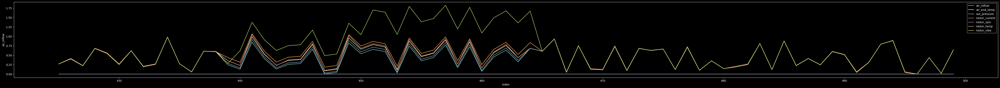

In [ ]:
show_data(st_te_df_3, df_cols.columns, start = 425, end = 500)

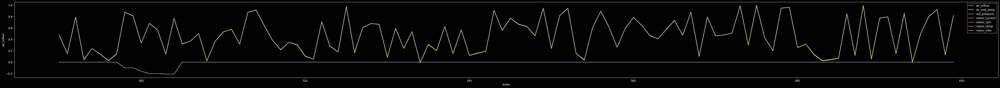

In [ ]:
show_data(st_te_df_4,df_cols.columns, start = 490, end = 600)

# 정답 데이터와 비교

In [ ]:
# 환준님이 보내주신 label
pred_data = pd.read_csv("/content/drive/MyDrive/데이터분석_프로젝트/ai_factory/data_set/pred_data.csv")

In [ ]:
pred_data.head(10)

,Unnamed: 0,type,label
0,0,0,0
1,1,0,0
2,2,0,0
3,3,0,0
4,4,0,0
5,5,0,0
6,6,0,0
7,7,0,0
8,8,0,0
9,9,0,0


In [ ]:
te_list = [st_te_df_0,st_te_df_1,st_te_df_2,st_te_df_3,st_te_df_4,st_te_df_5,st_te_df_6,st_te_df_7]

In [ ]:
st_te_data = pd.concat(te_list)

In [ ]:
st_te_data.reset_index(inplace = True)

In [ ]:
# scaling 한 데이터 concat
st_te_data.drop(["level_0", "index"], axis = 1, inplace = True)

In [ ]:
st_te_data["label"] = pred_data["label"]
st_te_data["type"] = pred_data["type"]

In [ ]:
st_te_data.head(5)

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
0,0.614350,0.617657,0.0,0.617708,0.617572,0.617647,0.618321,0,0
1,0.681614,0.684211,0.0,0.684028,0.684211,0.684110,0.687023,0,0
2,0.260090,0.259762,0.0,0.259722,0.259762,0.259740,0.259542,0,0
3,0.475336,0.477419,0.0,0.477431,0.477504,0.477464,0.480916,0,0
4,0.412556,0.413922,0.0,0.413889,0.413837,0.413675,0.412214,0,0


In [ ]:
anomaly_data = st_te_data[st_te_data["label"] == 1] 

In [ ]:
anomaly_data

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
585,0.107623,0.222411,0.00,0.220486,0.188455,0.188312,0.343511,1,0
586,0.412556,0.572496,0.00,0.586458,0.538625,0.226509,0.694656,1,0
587,0.094170,0.207470,0.00,0.204861,0.173599,0.264706,0.328244,1,0
588,0.771300,0.979287,0.00,1.011458,0.945246,0.302903,1.099237,1,0
589,0.215247,0.345331,0.00,0.348958,0.311545,0.341100,0.465649,1,0
590,0.784753,0.993209,0.00,1.026042,0.959253,0.379297,1.114504,1,0
591,0.031390,0.135484,0.00,0.129514,0.101443,0.417494,0.251908,1,0
592,0.067265,0.178608,0.00,0.174653,0.144737,0.144767,0.297710,1,0
593,0.076233,0.190153,0.00,0.186806,0.156197,0.156226,0.312977,1,0
594,0.659193,0.852292,0.00,0.878819,0.818336,0.818182,0.969466,1,0


In [ ]:
# 불량 개수 확인
anomaly_data["type"].value_counts()

0    143
6    101
5     30
2     27
3     26
4     13
7      4
Name: type, dtype: int64

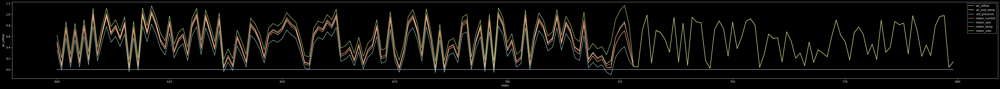

In [ ]:
show_data(st_te_data[st_te_data["type"] == 0], st_te_data.drop(["label", "type"],axis = 1).columns, start =600, end =800)

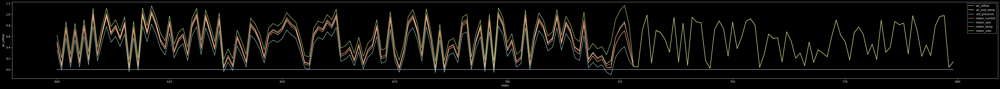

In [ ]:
show_data(st_te_data[st_te_data["type"] == 0], st_te_data.drop(["label", "type"],axis = 1).columns, start =600, end =800)

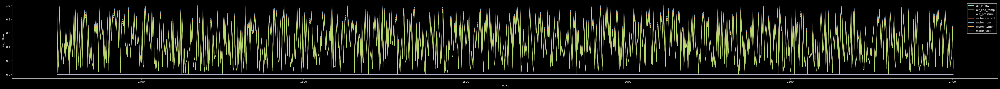

In [ ]:
show_data(st_te_data[st_te_data["type"] == 1], st_te_data.drop(["label", "type"],axis = 1).columns, start =0, end =-1)

In [ ]:
type_0 = anomaly_data[anomaly_data["type"] == 0] 
type_1 = anomaly_data[anomaly_data["type"] == 1] 
type_2 = anomaly_data[anomaly_data["type"] == 2] 
type_3 = anomaly_data[anomaly_data["type"] == 3] 
type_4 = anomaly_data[anomaly_data["type"] == 4] 
type_5 = anomaly_data[anomaly_data["type"] == 5] 
type_6 = anomaly_data[anomaly_data["type"] == 6] 
type_7 = anomaly_data[anomaly_data["type"] == 7] 

## 불량으로 예측한 데이터의 분포 시각화

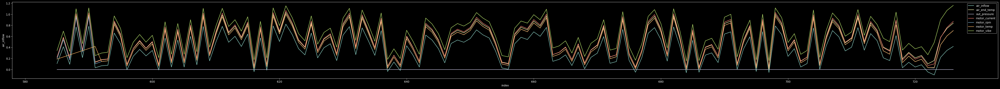

In [ ]:
show_data(type_0, type_0.drop(["label", "type"],axis = 1).columns, start =0, end =-1)

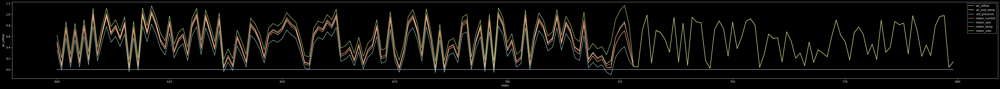

In [ ]:
show_data(st_te_data[st_te_data["type"] == 0], st_te_data.drop(["label", "type"],axis = 1).columns, start =600, end =800)

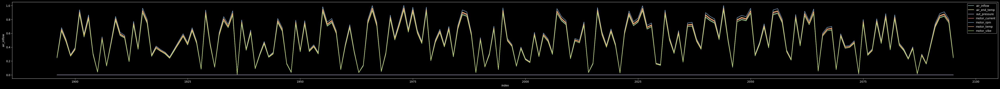

In [ ]:
show_data(st_te_data[st_te_data["type"] == 1], st_te_data.drop(["label", "type"],axis = 1).columns, start =600, end =800)

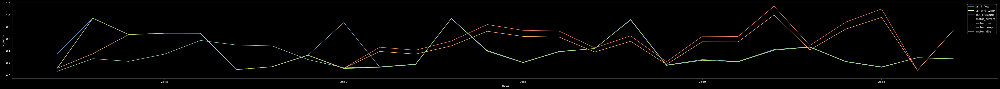

In [ ]:
show_data(type_2, type_2.drop(["label", "type"],axis = 1).columns, start =0, end =-1 )

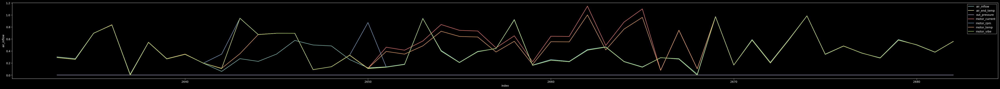

In [ ]:
show_data(st_te_data[st_te_data["type"] == 2], st_te_data.drop(["label", "type"],axis = 1).columns, start  = 230, end =280)

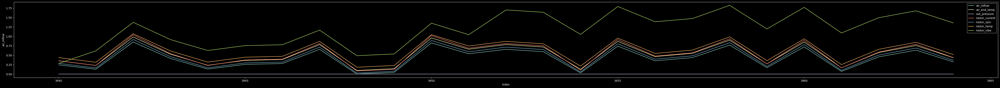

In [ ]:
show_data(type_3, type_3.drop(["label", "type"], axis = 1).columns, start =0, end =-1 )

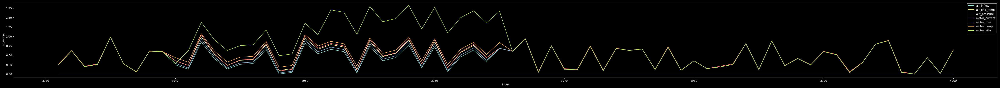

In [ ]:
show_data(st_te_data[st_te_data["type"] == 3], st_te_data.drop(["label", "type"],axis = 1).columns, start  = 430, end = 500)

In [ ]:
st_te_data[st_te_data["type"] == 3]

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
3501,0.070560,0.072424,0.0,0.083333,0.072248,0.072303,0.068702,0,3
3502,0.177616,0.178851,0.0,0.187500,0.178921,0.179036,0.175573,0,3
3503,0.863747,0.863652,0.0,0.875000,0.863578,0.863810,0.862595,0,3
3504,0.197080,0.196872,0.0,0.208333,0.196770,0.196634,0.198473,0,3
3505,0.781022,0.780007,0.0,0.791667,0.779856,0.780031,0.778626,0,3
3506,0.299270,0.299218,0.0,0.312500,0.299193,0.299158,0.297710,0,3
3507,0.980535,0.980619,0.0,0.979167,0.980450,0.980490,0.977099,0,3
3508,0.165450,0.165930,0.0,0.166667,0.165746,0.165647,0.167939,0,3
3509,0.863747,0.863652,0.0,0.875000,0.863578,0.863810,0.862595,0,3
3510,0.900243,0.899694,0.0,0.895833,0.899703,0.899770,0.900763,0,3


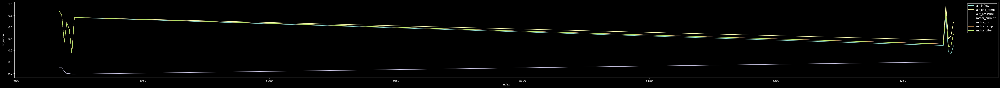

In [ ]:
show_data(type_4, type_4.drop(["label", "type"],axis = 1).columns, start =0, end =-1 )

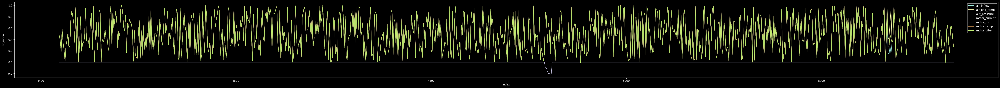

In [ ]:
show_data(st_te_data[st_te_data["type"] == 4], st_te_data.drop(["label", "type"],axis = 1).columns, start  = 0, end = -1)

In [ ]:
pd.options.display.max_rows = 1000

In [ ]:
st_te_data.iloc[4800 : 5300]

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
4800,0.211712,0.214918,0.00,0.214908,0.214985,0.214943,0.215385,0,4
4801,0.166667,0.166894,0.00,0.166841,0.166880,0.167050,0.161538,0,4
4802,0.792793,0.795640,0.00,0.795542,0.795658,0.795785,0.792308,0,4
4803,0.463964,0.463215,0.00,0.463253,0.463176,0.463218,0.461538,0,4
4804,0.324324,0.325613,0.00,0.325670,0.325670,0.325670,0.323077,0,4
4805,0.675676,0.678134,0.00,0.678161,0.678161,0.678161,0.676923,0,4
4806,0.635135,0.634877,0.00,0.634622,0.634738,0.634866,0.630769,0,4
4807,0.400901,0.403610,0.00,0.403692,0.403576,0.403448,0.400000,0,4
4808,0.797297,0.801090,0.00,0.801115,0.801192,0.801149,0.800000,0,4
4809,0.418919,0.422003,0.00,0.421804,0.421882,0.421839,0.423077,0,4


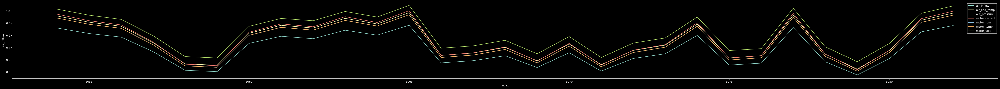

In [ ]:
show_data(type_5, type_5.drop(["label", "type"],axis = 1).columns, start =0, end =-1 )

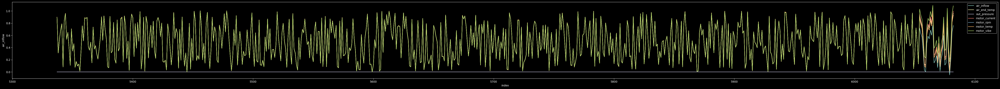

In [ ]:
show_data(st_te_data[st_te_data["type"] == 5], st_te_data.drop(["label", "type"],axis = 1).columns, start =0, end =-1 )

In [ ]:
st_te_data[st_te_data["type"] == 5]

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
5337,0.896396,0.898467,0.0,0.898606,0.898637,0.898812,0.893130,0,5
5338,0.310811,0.311414,0.0,0.311498,0.311329,0.311230,0.312977,0,5
5339,0.531532,0.531516,0.0,0.531707,0.531516,0.531621,0.526718,0,5
5340,0.689189,0.688586,0.0,0.688850,0.688671,0.688770,0.687023,0,5
5341,0.788288,0.790119,0.0,0.789895,0.790034,0.789958,0.786260,0,5
5342,0.081081,0.081431,0.0,0.081533,0.081346,0.081257,0.083969,0,5
5343,0.837838,0.838842,0.0,0.839024,0.839012,0.839019,0.839695,0,5
5344,0.959459,0.959796,0.0,0.959930,0.959966,0.960138,0.954198,0,5
5345,0.536036,0.537308,0.0,0.537631,0.537479,0.537371,0.534351,0,5
5346,0.648649,0.648041,0.0,0.648084,0.648211,0.648141,0.648855,0,5


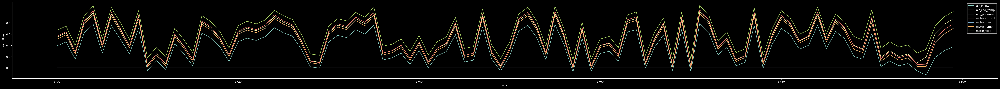

In [ ]:
show_data(type_6, type_6.drop(["label", "type"],axis = 1).columns, start =0, end =-1 )

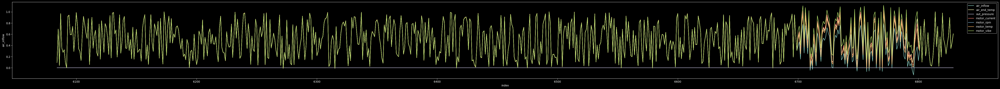

In [ ]:
show_data(st_te_data[st_te_data["type"] == 6], st_te_data.drop(["label", "type"],axis = 1).columns, start =0, end =-1 )

In [ ]:
st_te_data[st_te_data["type"] == 6]

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
6084,0.095455,0.095320,0.0,0.095707,0.095484,0.095238,0.100000,0,6
6085,0.690909,0.692361,0.0,0.692470,0.692473,0.692605,0.692308,0,6
6086,0.040909,0.041638,0.0,0.041872,0.041720,0.041425,0.046154,0,6
6087,0.968182,0.969030,0.0,0.969036,0.969032,0.969028,0.969231,0,6
6088,0.354545,0.353063,0.0,0.353272,0.353118,0.353078,0.353846,0,6
6089,0.277273,0.277357,0.0,0.277621,0.277419,0.277197,0.276923,0,6
6090,0.322727,0.322780,0.0,0.323012,0.323011,0.322880,0.323077,0,6
6091,0.086364,0.087061,0.0,0.087262,0.087312,0.087108,0.092308,0,6
6092,0.000000,0.000344,0.0,0.000704,0.000430,0.000387,0.000000,0,6
6093,0.918182,0.921198,0.0,0.921182,0.921290,0.921409,0.915385,0,6


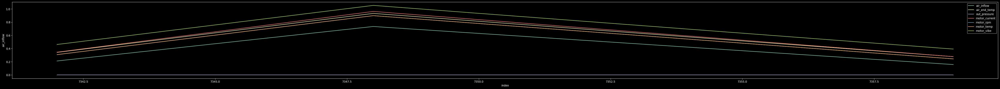

In [ ]:
show_data(type_7, type_7.drop(["label", "type"],axis = 1).columns, start =0, end =-1 )

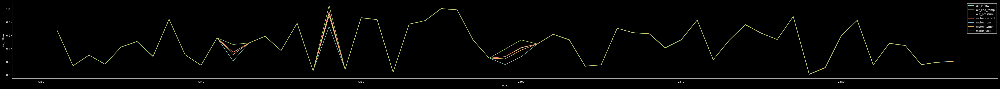

In [ ]:
show_data(st_te_data[st_te_data["type"] == 7], st_te_data.drop(["label", "type"],axis = 1).columns, start =500, end =-1 )

In [ ]:
pd.options.display.max_rows = 2000

In [ ]:
#index 728

In [ ]:
st_te_data[st_te_data["type"] == 0]

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
0,0.614350,0.617657,0.0,0.617708,0.617572,0.617647,0.618321,0,0
1,0.681614,0.684211,0.0,0.684028,0.684211,0.684110,0.687023,0,0
2,0.260090,0.259762,0.0,0.259722,0.259762,0.259740,0.259542,0,0
3,0.475336,0.477419,0.0,0.477431,0.477504,0.477464,0.480916,0,0
4,0.412556,0.413922,0.0,0.413889,0.413837,0.413675,0.412214,0,0
5,0.233184,0.232937,0.0,0.232986,0.233022,0.233002,0.236641,0,0
6,0.156951,0.158574,0.0,0.158681,0.158744,0.158900,0.160305,0,0
7,0.475336,0.475042,0.0,0.475000,0.474958,0.474790,0.473282,0,0
8,0.843049,0.845501,0.0,0.845486,0.845501,0.845302,0.847328,0,0
9,0.614350,0.614261,0.0,0.614236,0.614177,0.614209,0.610687,0,0


In [ ]:
st_te_data[st_te_data["type"] == 7]

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
6831,0.882883,0.884760,0.0,0.884897,0.884910,0.884925,0.884615,0,7
6832,0.432432,0.431981,0.0,0.431810,0.431799,0.431914,0.430769,0,7
6833,0.103604,0.101262,0.0,0.101151,0.101023,0.101266,0.100000,0,7
6834,0.355856,0.352881,0.0,0.352982,0.352941,0.352896,0.353846,0,7
6835,0.986486,0.984657,0.0,0.984653,0.984655,0.984657,0.984615,0,7
6836,0.869369,0.870099,0.0,0.869899,0.869991,0.869965,0.869231,0,7
6837,0.698198,0.698261,0.0,0.698291,0.698210,0.698120,0.700000,0,7
6838,0.049550,0.050119,0.0,0.049878,0.049872,0.049866,0.046154,0,7
6839,0.018018,0.016365,0.0,0.016045,0.016198,0.016494,0.015385,0,7
6840,0.572072,0.573474,0.0,0.573422,0.573316,0.573456,0.569231,0,7


In [ ]:
type_7

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
7342,0.211712,0.341971,0.0,0.344960,0.307758,0.308017,0.461538,1,7
7348,0.734234,0.932492,0.0,0.962679,0.898551,0.898734,1.053846,1,7
7359,0.157658,0.277532,0.0,0.277642,0.243393,0.243575,0.392308,1,7
7360,0.274775,0.410501,0.0,0.416812,0.376385,0.376678,0.530769,1,7


In [ ]:
type_6.tail()

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
6796,-0.127273,0.189264,0.0,0.054539,0.017204,0.024390,0.330769,1,6
6797,0.186364,0.614246,0.0,0.508445,0.442151,0.442122,0.746154,1,6
6798,0.304545,0.777701,0.0,0.682970,0.605591,0.605497,0.915385,1,6
6799,0.377273,0.876118,0.0,0.788177,0.704086,0.704220,1.007692,1,6
6800,0.127273,0.534067,0.0,0.422942,0.362151,0.361982,0.669231,1,6


In [ ]:
type_5.head(20)

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
6054,0.720721,0.918228,0.0,0.947735,0.884157,0.884247,1.030534,1,5
6055,0.630631,0.816014,0.0,0.840767,0.781942,0.781909,0.931298,1,5
6056,0.572072,0.749574,0.0,0.771429,0.715503,0.715600,0.862595,1,5
6057,0.333333,0.480750,0.0,0.490592,0.446763,0.446915,0.595420,1,5
6058,0.027027,0.133220,0.0,0.127178,0.099233,0.099272,0.251908,1,5
6059,0.004505,0.109370,0.0,0.102091,0.075383,0.075508,0.229008,1,5
6060,0.468468,0.635094,0.0,0.651568,0.600937,0.600997,0.748092,1,5
6061,0.585586,0.765247,0.0,0.787805,0.731261,0.731315,0.877863,1,5
6062,0.545045,0.720273,0.0,0.740767,0.686116,0.686087,0.839695,1,5
6063,0.684685,0.879046,0.0,0.906620,0.844974,0.845151,0.992366,1,5


In [ ]:
type_4

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
4917,0.873874,0.875000,-0.10,0.874956,0.874840,0.874713,0.876923,1,4
4918,0.810811,0.814033,-0.10,0.814002,0.813963,0.813793,0.815385,1,4
4919,0.337838,0.337193,-0.16,0.337165,0.337165,0.337165,0.338462,1,4
4920,0.680180,0.680177,-0.20,0.680251,0.680289,0.680460,0.676923,1,4
4921,0.558559,0.561649,-0.20,0.561477,0.561516,0.561686,0.561538,1,4
4922,0.139640,0.141689,-0.21,0.141762,0.141762,0.141762,0.138462,1,4
4923,0.765766,0.768392,-0.21,0.768373,0.768412,0.768582,0.769231,1,4
5266,0.283784,0.378406,0.00,0.310345,0.310345,0.310345,0.307692,1,4
5267,0.792793,0.976499,0.00,0.874260,0.874415,0.874330,0.876923,1,4
5268,0.171171,0.398161,0.00,0.261930,0.261814,0.261686,0.261538,1,4


In [ ]:
type_3

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
3940,0.245742,0.352941,0.0,0.354167,0.284743,0.437643,0.282443,1,3
3941,0.128954,0.229514,0.0,0.229167,0.161496,0.314461,0.618321,1,3
3942,0.851582,0.986399,0.0,1.041667,0.918402,1.071538,1.374046,1,3
3943,0.413625,0.528732,0.0,0.541667,0.460688,0.613619,0.916031,1,3
3944,0.133820,0.234274,0.0,0.229167,0.166171,0.319051,0.625954,1,3
3945,0.257908,0.364162,0.0,0.375000,0.296218,0.449120,0.755725,1,3
3946,0.279805,0.386263,0.0,0.395833,0.318317,0.471308,0.778626,1,3
3947,0.656934,0.783067,0.0,0.812500,0.714832,0.868018,1.167939,1,3
3948,0.002433,0.097246,0.0,0.083333,0.029324,0.182096,0.488550,1,3
3949,0.046229,0.143829,0.0,0.125000,0.075648,0.228768,0.534351,1,3


In [ ]:
type_0

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
585,0.107623,0.222411,0.0,0.220486,0.188455,0.188312,0.343511,1,0
586,0.412556,0.572496,0.0,0.586458,0.538625,0.226509,0.694656,1,0
587,0.094170,0.207470,0.0,0.204861,0.173599,0.264706,0.328244,1,0
588,0.771300,0.979287,0.0,1.011458,0.945246,0.302903,1.099237,1,0
589,0.215247,0.345331,0.0,0.348958,0.311545,0.341100,0.465649,1,0
590,0.784753,0.993209,0.0,1.026042,0.959253,0.379297,1.114504,1,0
591,0.031390,0.135484,0.0,0.129514,0.101443,0.417494,0.251908,1,0
592,0.067265,0.178608,0.0,0.174653,0.144737,0.144767,0.297710,1,0
593,0.076233,0.190153,0.0,0.186806,0.156197,0.156226,0.312977,1,0
594,0.659193,0.852292,0.0,0.878819,0.818336,0.818182,0.969466,1,0


In [ ]:
st_te_data[st_te_data["type"] == 1].head(10)

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,label,type
1296,0.849315,0.880607,0.0,0.867862,0.910486,0.876986,0.843972,0,1
1297,0.020548,0.023417,0.0,0.023124,0.024297,0.023642,0.021277,0,1
1298,0.178082,0.186346,0.0,0.183577,0.192668,0.185815,0.177305,0,1
1299,0.917808,0.952177,0.0,0.938650,0.984655,0.948282,0.914894,0,1
1300,0.609589,0.631926,0.0,0.622935,0.653453,0.629479,0.602837,0,1
1301,0.157534,0.165897,0.0,0.163756,0.171782,0.165497,0.163121,0,1
1302,0.410959,0.424472,0.0,0.418594,0.439045,0.422977,0.404255,0,1
1303,0.417808,0.434697,0.0,0.428504,0.449702,0.433321,0.418440,0,1
1304,0.150685,0.157322,0.0,0.155262,0.162830,0.157000,0.148936,0,1
1305,0.424658,0.439314,0.0,0.433223,0.454390,0.437754,0.418440,0,1


In [ ]:
pred_data["label"].iloc[6056]

1

In [ ]:
#type 5 airfolw motor_vibe
#pred_data["label"].iloc[6056] 

In [ ]:
#pred_data.to_csv("sub_0.csv", index = False)

In [ ]:
#pred_data["label"].iloc[4917] = 0

In [ ]:
#pred_data["label"].iloc[4917]

In [ ]:
pred_data.to_csv("sub_1.csv", index = False)

In [ ]:
pred_data["label"].iloc[[4919, 4920, 4922]]

4919    1
4920    1
4922    1
Name: label, dtype: int64

In [ ]:
pred_data["label"].iloc[[4919, 4920, 4922]] = 0

In [ ]:
pred_data["label"].iloc[[4919, 4920, 4922]]

4919    0
4920    0
4922    0
Name: label, dtype: int64

In [ ]:
pred_data.to_csv("sub_2.csv", index = False)

In [ ]:
test_1 = pd.read_csv("label.csv")

In [ ]:
test_2 = pd.read_csv("sub_df_1.csv")

In [ ]:
te_1 = test_1["label"].values

In [ ]:
st_te_data["te1_label"] = te_1

In [ ]:
st_st_te_data["label"].index

NameError: ignored

In [ ]:
test_2

In [ ]:
st_te_data["te2_label"] = test_2["label"].values

In [ ]:
st_te_data[st_te_data["type"] == 0]

In [ ]:
st_te_data[st_te_data["type"] == 2]

In [ ]:
st_te_data[st_te_data["type"] == 3]

In [ ]:
# 5265

In [ ]:
st_te_data[st_te_data["type"] == 4]

In [ ]:
st_te_data[st_te_data["type"] == 5]

In [ ]:
st_te_data[st_te_data["type"] == 6]

In [ ]:
st_te_data[st_te_data["type"] == 7]

In [ ]:
plt.figure(figsize=(50,10))
plt.subplot(2,1,1)
plt.plot(st_te_data['label'][:], label='cu')
plt.subplot(2,1,2)
plt.plot(st_te_data['te2_label'][:], label='ok')
plt.show

In [ ]:
st_te_data['label'].value_counts()

In [ ]:
st_te_data['te2_label'].value_counts()

In [1]:
a = "제출서류 중에 졸업증명서, 성적증명서가 있던데 미국 4년제 대학의 경우에는 졸업증명서와 성적증명서라는게 없고 그냥 졸업장이랑 성적표만 있습니다. 졸업증명서와 성적증명서 제출을 졸업장이랑 성적표 제출로 대체가 가능한지 여쭙습니다."

In [2]:
len(a)

127

In [3]:
355 - 296

59